In [283]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image


In [284]:
def computeH(img1_pts, img2_pts):
    n = img1_pts.shape[0]
    
    A = np.zeros((2*n, 8))
    b = np.zeros(2*n)
    
    for i in range(n):
        x, y = img1_pts[i]
        xp, yp = img2_pts[i]
        
        A[2*i, 0] = x
        A[2*i, 1] = y
        A[2*i, 2] = 1
        A[2*i, 3] = 0
        A[2*i, 4] = 0
        A[2*i, 5] = 0
        A[2*i, 6] = -x*xp
        A[2*i, 7] = -y*xp
        b[2*i] = xp
        
        A[2*i+1, 0] = 0
        A[2*i+1, 1] = 0
        A[2*i+1, 2] = 0
        A[2*i+1, 3] = x
        A[2*i+1, 4] = y
        A[2*i+1, 5] = 1
        A[2*i+1, 6] = -x*yp
        A[2*i+1, 7] = -y*yp
        b[2*i+1] = yp
    
    h = np.linalg.lstsq(A, b, rcond=None)[0]
    
    H = np.array([[h[0], h[1], h[2]],
                  [h[3], h[4], h[5]],
                  [h[6], h[7], 1.0]])
    
    return H


In [285]:
img1 = Image.open('images/left_perspective.jpg')
img2 = Image.open('images/right_perspective.jpg')

img1_array = np.array(img1)
img2_array = np.array(img2)

In [286]:
%matplotlib qt

plt.imshow(img1_array)
plt.title('Click 15 corresponding points - left perspective')

points1 = plt.ginput(n=15, timeout=0)
plt.close()

%matplotlib inline

In [296]:
%matplotlib qt

plt.imshow(img2_array)
plt.title('Click 15 corresponding points - right perspective')

points2 = plt.ginput(n=15, timeout=0)
plt.close()

%matplotlib inline

In [329]:
img1_pts = np.array(points1)
img2_pts = np.array(points2)

plt.figure(figsize=(8, 6))
plt.imshow(img1_array)
plt.scatter(img1_pts[:, 0], img1_pts[:, 1], c='red', s=100, marker='o', edgecolors='white', linewidth=2)
for i, (x, y) in enumerate(img1_pts):
    plt.annotate(f'{i+1}', (x, y), xytext=(5, 5), textcoords='offset points', 
                 color='white', fontsize=12, fontweight='bold')
plt.title('Left Image - Selected Points')
plt.axis('off')
plt.tight_layout()
plt.savefig('./final_images/01_correspondences_left.png', dpi=150, bbox_inches='tight')
plt.close()

plt.figure(figsize=(8, 6))
plt.imshow(img2_array)
plt.scatter(img2_pts[:, 0], img2_pts[:, 1], c='red', s=100, marker='o', edgecolors='white', linewidth=2)
for i, (x, y) in enumerate(img2_pts):
    plt.annotate(f'{i+1}', (x, y), xytext=(5, 5), textcoords='offset points', 
                 color='white', fontsize=12, fontweight='bold')
plt.title('Right Image - Selected Points')
plt.axis('off')
plt.tight_layout()
plt.savefig('./final_images/01_correspondences_right.png', dpi=150, bbox_inches='tight')
plt.close()

In [299]:
def warpImageNearestNeighbor(im, H):
    h, w = im.shape[:2]

    corners = np.array([
        [0, 0, 1],    # top left
        [w-1, 0, 1],  # top right
        [w-1, h-1, 1], # bottom right
        [0, h-1, 1]   # bottom left
    ]).T
    
    warped_corners = H @ corners
    temp = warped_corners[:2]
    warped_corners = temp / warped_corners[2]
    
    min_x, max_x = int(np.floor(warped_corners[0].min())), int(np.ceil(warped_corners[0].max()))
    min_y, max_y = int(np.floor(warped_corners[1].min())), int(np.ceil(warped_corners[1].max()))
    
    out_w = max_x - min_x + 1
    out_h = max_y - min_y + 1
    
    if len(im.shape) == 3:
        imwarped = np.zeros((out_h, out_w, im.shape[2]), dtype=im.dtype)
    else:
        imwarped = np.zeros((out_h, out_w), dtype=im.dtype)
    
    mask = np.zeros((out_h, out_w), dtype=bool)
    
    H_inv = np.linalg.inv(H)
    
    for y_out in range(out_h):
        for x_out in range(out_w):
            x_world = x_out + min_x
            y_world = y_out + min_y
            
            src_coord = H_inv @ np.array([x_world, y_world, 1])
            src_coord = src_coord[:2] / src_coord[2]

            x_src, y_src = src_coord
            
            if 0 <= x_src < w-1 and 0 <= y_src < h-1:
                x_nn = int(round(x_src))
                y_nn = int(round(y_src))
                
                x_nn = max(0, min(x_nn, w-1))
                y_nn = max(0, min(y_nn, h-1))
                
                imwarped[y_out, x_out] = im[y_nn, x_nn]
                mask[y_out, x_out] = True
    
    return imwarped, mask


In [300]:
def warpImageBilinear(im, H):
    h, w = im.shape[:2]
    corners = np.array([
        [0, 0, 1],    # top left
        [w-1, 0, 1],  # top right
        [w-1, h-1, 1], # bottom right
        [0, h-1, 1]   # bottom left
    ]).T
    
    warped_corners = H @ corners
    temp = warped_corners[:2]
    warped_corners = temp / warped_corners[2]

    min_x, max_x = int(np.floor(warped_corners[0].min())), int(np.ceil(warped_corners[0].max()))
    min_y, max_y = int(np.floor(warped_corners[1].min())), int(np.ceil(warped_corners[1].max()))
    
    out_w = max_x - min_x + 1
    out_h = max_y - min_y + 1
    
    if len(im.shape) == 3:
        imwarped = np.zeros((out_h, out_w, im.shape[2]), dtype=im.dtype)
    else:
        imwarped = np.zeros((out_h, out_w), dtype=im.dtype)
    
    mask = np.zeros((out_h, out_w), dtype=bool)
    
    H_inv = np.linalg.inv(H)
    
    for y_out in range(out_h):
        for x_out in range(out_w):
            x_world = x_out + min_x
            y_world = y_out + min_y
            
            src_coord = H_inv @ np.array([x_world, y_world, 1])
            src_coord = src_coord[:2] / src_coord[2]
            
            x_src, y_src = src_coord
            
            if 0 <= x_src < w-1 and 0 <= y_src < h-1:
                x1, y1 = int(np.floor(x_src)), int(np.floor(y_src))
                x2, y2 = x1 + 1, y1 + 1
                
                x1 = max(0, min(x1, w-1))
                y1 = max(0, min(y1, h-1))
                x2 = max(0, min(x2, w-1))
                y2 = max(0, min(y2, h-1))
                
                dx = x_src - x1
                dy = y_src - y1
                
                if len(im.shape) == 3:
                    p11 = im[y1, x1].astype(np.float64)
                    p12 = im[y1, x2].astype(np.float64)
                    p21 = im[y2, x1].astype(np.float64)
                    p22 = im[y2, x2].astype(np.float64)
                    
                    interpolated = (p11 * (1-dx) * (1-dy) + 
                                  p12 * dx * (1-dy) + 
                                  p21 * (1-dx) * dy + 
                                  p22 * dx * dy)
                    
                    imwarped[y_out, x_out] = np.clip(interpolated, 0, 255).astype(im.dtype)
                else:
                    p11 = float(im[y1, x1])
                    p12 = float(im[y1, x2])
                    p21 = float(im[y2, x1])
                    p22 = float(im[y2, x2])
                    
                    interpolated = (p11 * (1-dx) * (1-dy) + 
                                  p12 * dx * (1-dy) + 
                                  p21 * (1-dx) * dy + 
                                  p22 * dx * dy)
                    
                    imwarped[y_out, x_out] = np.clip(interpolated, 0, 255).astype(im.dtype)
                
                mask[y_out, x_out] = True
    
    return imwarped, mask


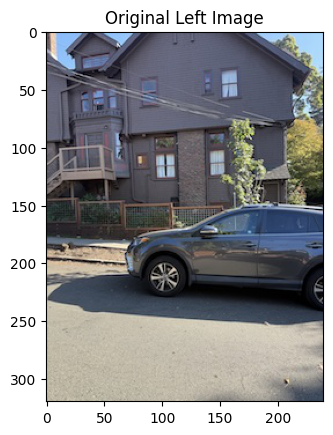

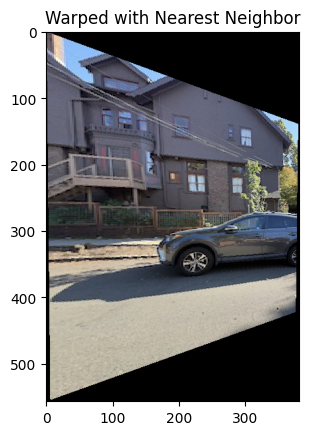

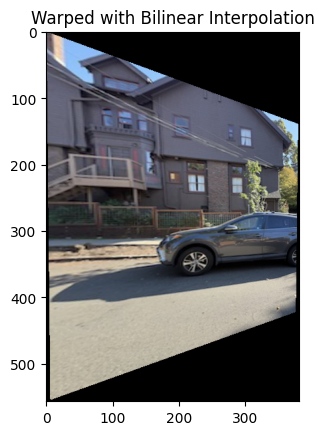

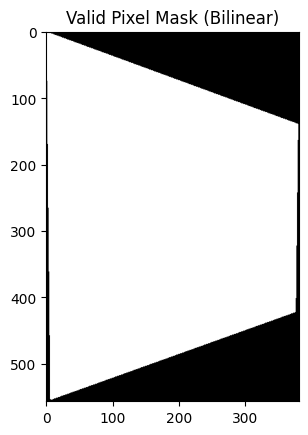

In [301]:

H = computeH(img1_pts, img2_pts)
imwarped_nn, mask_nn = warpImageNearestNeighbor(img1_array, H)
imwarped_bil, mask_bil = warpImageBilinear(img1_array, H)

plt.imshow(img1_array)
plt.title('Original Left Image')
plt.savefig('./final_images/02_original_left.png', dpi=150, bbox_inches='tight')
plt.show()

plt.imshow(imwarped_nn)
plt.title('Warped with Nearest Neighbor')
plt.savefig('./final_images/03_warped_nn.png', dpi=150, bbox_inches='tight')
plt.show()

plt.imshow(imwarped_bil)
plt.title('Warped with Bilinear Interpolation')
plt.savefig('./final_images/04_warped_bilinear.png', dpi=150, bbox_inches='tight')
plt.show()

plt.imshow(mask_bil, cmap='gray')
plt.title('Valid Pixel Mask (Bilinear)')
plt.savefig('./final_images/05_mask_bilinear.png', dpi=150, bbox_inches='tight')
plt.show()


In [302]:
poster = Image.open('./images/poster.jpg')
poster = np.array(poster)

In [ ]:
%matplotlib qt

plt.imshow(poster)
plt.title('Select 4 corners of a rectangular region to rectify\n(Click: top-left, top-right, bottom-right, bottom-left)')
plt.show()

rect_corners = plt.ginput(n=4, timeout=0)
plt.close()

%matplotlib inline

rect_pts = np.array(rect_corners)
min_x, max_x = rect_pts[:, 0].min(), rect_pts[:, 0].max()
min_y, max_y = rect_pts[:, 1].min(), rect_pts[:, 1].max()
width = max_x - min_x
height = max_y - min_y
side_length = int((width + height) / 2)

target_pts = np.array([
    [0, 0],                    # top left
    [side_length, 0],          # top right
    [side_length, side_length], # bottom right
    [0, side_length]           # bottom left
])

H_rect = computeH(rect_pts, target_pts)

print("Rectification Homography Matrix:")
print(H_rect)


Select 4 corners of a rectangular region in the left image...
Rectification Homography Matrix:

[[ 6.56918608e+00  3.40624463e-01 -4.23697019e+02]
 [ 1.85909694e+00  2.72931253e+00 -4.04450246e+02]
 [ 1.76236107e-02  3.41575024e-03  1.00000000e+00]]



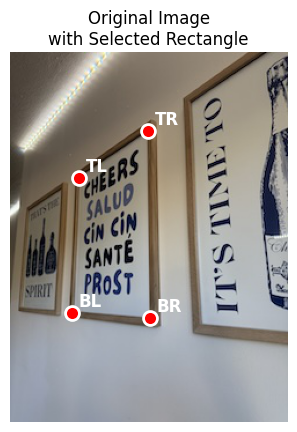

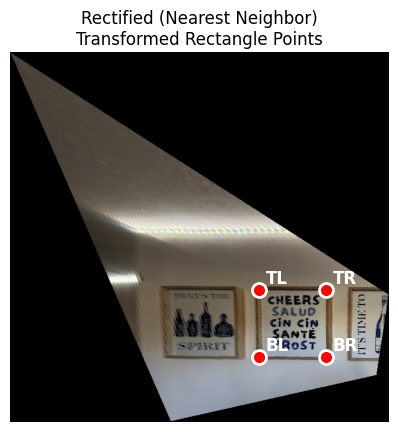

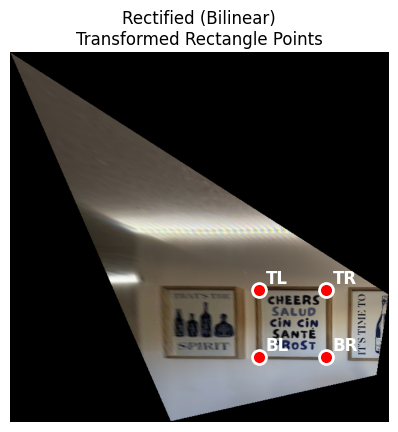

Cropping to rectangle region: x=[413:549], y=[394:530]


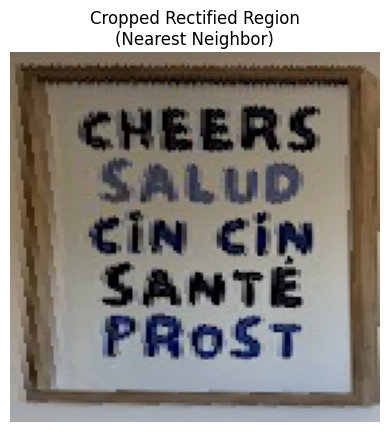

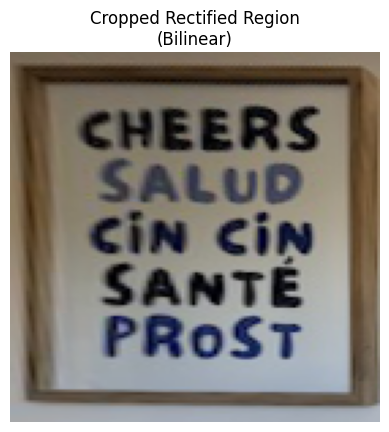

In [ ]:
rectified_nn, mask_rect_nn = warpImageNearestNeighbor(poster, H_rect)
rectified_bil, mask_rect_bil = warpImageBilinear(poster, H_rect)

rect_pts_homogeneous = np.column_stack([rect_pts, np.ones(4)])

warped_rect_pts = H_rect @ rect_pts_homogeneous.T
warped_rect_pts = warped_rect_pts[:2] / warped_rect_pts[2] 

corners = np.array([
    [0, 0, 1],    # top left
    [img1_array.shape[1]-1, 0, 1],  # top right
    [img1_array.shape[1]-1, img1_array.shape[0]-1, 1], # bottom right
    [0, img1_array.shape[0]-1, 1]   # bottom left
]).T

warped_corners = H_rect @ corners
warped_corners = warped_corners[:2] / warped_corners[2] 
min_x_out, min_y_out = int(np.floor(warped_corners[0].min())), int(np.floor(warped_corners[1].min()))

rect_pts_in_output = warped_rect_pts.T - np.array([min_x_out, min_y_out])

plt.imshow(poster)
plt.scatter(rect_pts[:, 0], rect_pts[:, 1], c='red', s=100, marker='o', edgecolors='white', linewidth=2)
for i, (x, y) in enumerate(rect_pts):
    corner_names = ['TL', 'TR', 'BR', 'BL']
    plt.annotate(corner_names[i], (x, y), xytext=(5, 5), textcoords='offset points', 
                       color='white', fontsize=12, fontweight='bold')
plt.title('Original Image\nwith Selected Rectangle')
plt.axis('off')
plt.savefig('./final_images/06_poster_original.png', dpi=150, bbox_inches='tight')
plt.show()
plt.imshow(rectified_nn)
plt.scatter(rect_pts_in_output[:, 0], rect_pts_in_output[:, 1], 
                  c='red', s=100, marker='o', edgecolors='white', linewidth=2)
for i, (x, y) in enumerate(rect_pts_in_output):
    corner_names = ['TL', 'TR', 'BR', 'BL']
    plt.annotate(corner_names[i], (x, y), xytext=(5, 5), textcoords='offset points', 
                       color='white', fontsize=12, fontweight='bold')
plt.title('Rectified (Nearest Neighbor)\nTransformed Rectangle Points')
plt.axis('off')
plt.savefig('./final_images/07_poster_rectified_nn.png', dpi=150, bbox_inches='tight')
plt.show()

plt.imshow(rectified_bil)
plt.scatter(rect_pts_in_output[:, 0], rect_pts_in_output[:, 1], 
                  c='red', s=100, marker='o', edgecolors='white', linewidth=2)
for i, (x, y) in enumerate(rect_pts_in_output):
    corner_names = ['TL', 'TR', 'BR', 'BL']
    plt.annotate(corner_names[i], (x, y), xytext=(5, 5), textcoords='offset points', 
                       color='white', fontsize=12, fontweight='bold')
plt.title('Rectified (Bilinear)\nTransformed Rectangle Points')
plt.axis('off')
plt.savefig('./final_images/08_poster_rectified_bilinear.png', dpi=150, bbox_inches='tight')
plt.show()

min_x_rect = int(np.floor(rect_pts_in_output[:, 0].min()))
max_x_rect = int(np.ceil(rect_pts_in_output[:, 0].max()))
min_y_rect = int(np.floor(rect_pts_in_output[:, 1].min()))
max_y_rect = int(np.ceil(rect_pts_in_output[:, 1].max()))

padding = 10
min_x_rect = max(0, min_x_rect - padding)
max_x_rect = min(rectified_nn.shape[1], max_x_rect + padding)
min_y_rect = max(0, min_y_rect - padding)
max_y_rect = min(rectified_nn.shape[0], max_y_rect + padding)

plt.imshow(rectified_nn[min_y_rect:max_y_rect, min_x_rect:max_x_rect])
plt.title('Cropped Rectified Region\n(Nearest Neighbor)')
plt.axis('off')
plt.savefig('./final_images/09_poster_cropped_nn.png', dpi=150, bbox_inches='tight')
plt.show()

plt.imshow(rectified_bil[min_y_rect:max_y_rect, min_x_rect:max_x_rect])
plt.title('Cropped Rectified Region\n(Bilinear)')
plt.axis('off')
plt.savefig('./final_images/10_poster_cropped_bilinear.png', dpi=150, bbox_inches='tight')
plt.show()


In [305]:
floor = Image.open('./images/floor.jpg')
floor = np.array(floor)

In [306]:
%matplotlib qt

plt.imshow(floor)
plt.title('Select 4 corners of a rectangular region to rectify\n(Click: top-left, top-right, bottom-right, bottom-left)')

rect_corners = plt.ginput(n=4, timeout=0)
plt.close()

%matplotlib inline

rect_pts = np.array(rect_corners)
min_x, max_x = rect_pts[:, 0].min(), rect_pts[:, 0].max()
min_y, max_y = rect_pts[:, 1].min(), rect_pts[:, 1].max()
width = max_x - min_x
height = max_y - min_y
side_length = int((width + height) / 2)

target_pts = np.array([
    [0, 0],                    # top left
    [side_length, 0],          # top right
    [side_length, side_length], # bottom right
    [0, side_length]           # bottom left
])

H_rect = computeH(rect_pts, target_pts)


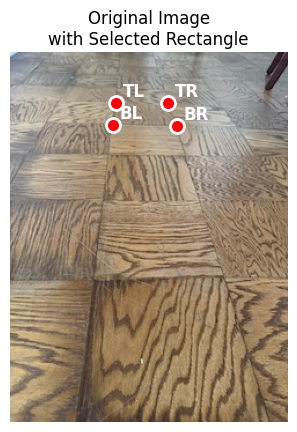

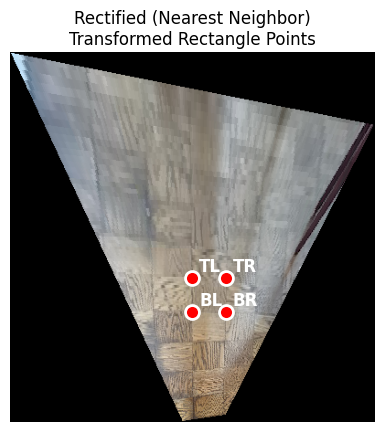

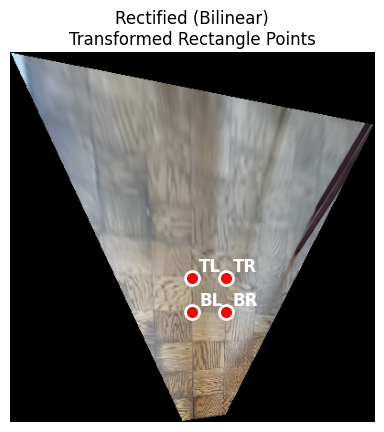

Cropping to rectangle region: x=[189:246], y=[236:294]


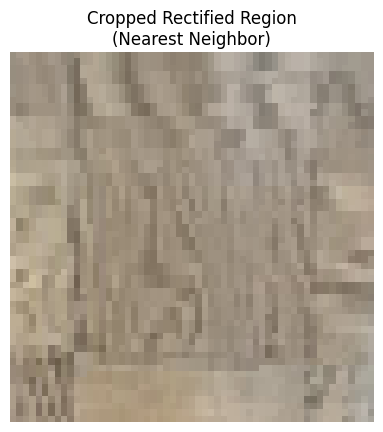

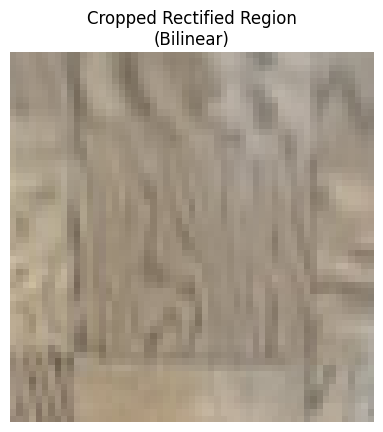

In [ ]:

rectified_nn, mask_rect_nn = warpImageNearestNeighbor(floor, H_rect)
rectified_bil, mask_rect_bil = warpImageBilinear(floor, H_rect)

rect_pts_homogeneous = np.column_stack([rect_pts, np.ones(4)])

warped_rect_pts = H_rect @ rect_pts_homogeneous.T
warped_rect_pts = warped_rect_pts[:2] / warped_rect_pts[2] 

corners = np.array([
    [0, 0, 1],    # top left
    [floor.shape[1]-1, 0, 1],  # top right
    [floor.shape[1]-1, floor.shape[0]-1, 1], # bottom right
    [0, floor.shape[0]-1, 1]   # bottom left
]).T

warped_corners = H_rect @ corners
warped_corners = warped_corners[:2] / warped_corners[2] 
min_x_out, min_y_out = int(np.floor(warped_corners[0].min())), int(np.floor(warped_corners[1].min()))

rect_pts_in_output = warped_rect_pts.T - np.array([min_x_out, min_y_out])

plt.imshow(floor)
plt.scatter(rect_pts[:, 0], rect_pts[:, 1], c='red', s=100, marker='o', edgecolors='white', linewidth=2)
for i, (x, y) in enumerate(rect_pts):
    corner_names = ['TL', 'TR', 'BR', 'BL']
    plt.annotate(corner_names[i], (x, y), xytext=(5, 5), textcoords='offset points', 
                       color='white', fontsize=12, fontweight='bold')
plt.title('Original Image\nwith Selected Rectangle')
plt.axis('off')
plt.savefig('./final_images/11_floor_original.png', dpi=150, bbox_inches='tight')
plt.show()
plt.imshow(rectified_nn)
plt.scatter(rect_pts_in_output[:, 0], rect_pts_in_output[:, 1], 
                  c='red', s=100, marker='o', edgecolors='white', linewidth=2)
for i, (x, y) in enumerate(rect_pts_in_output):
    corner_names = ['TL', 'TR', 'BR', 'BL']
    plt.annotate(corner_names[i], (x, y), xytext=(5, 5), textcoords='offset points', 
                       color='white', fontsize=12, fontweight='bold')
plt.title('Rectified (Nearest Neighbor)\nTransformed Rectangle Points')
plt.axis('off')
plt.savefig('./final_images/12_floor_rectified_nn.png', dpi=150, bbox_inches='tight')
plt.show()

plt.imshow(rectified_bil)
plt.scatter(rect_pts_in_output[:, 0], rect_pts_in_output[:, 1], 
                  c='red', s=100, marker='o', edgecolors='white', linewidth=2)
for i, (x, y) in enumerate(rect_pts_in_output):
    corner_names = ['TL', 'TR', 'BR', 'BL']
    plt.annotate(corner_names[i], (x, y), xytext=(5, 5), textcoords='offset points', 
                       color='white', fontsize=12, fontweight='bold')
plt.title('Rectified (Bilinear)\nTransformed Rectangle Points')
plt.axis('off')
plt.savefig('./final_images/13_floor_rectified_bilinear.png', dpi=150, bbox_inches='tight')
plt.show()

min_x_rect = int(np.floor(rect_pts_in_output[:, 0].min()))
max_x_rect = int(np.ceil(rect_pts_in_output[:, 0].max()))
min_y_rect = int(np.floor(rect_pts_in_output[:, 1].min()))
max_y_rect = int(np.ceil(rect_pts_in_output[:, 1].max()))

padding = 10
min_x_rect = max(0, min_x_rect - padding)
max_x_rect = min(rectified_nn.shape[1], max_x_rect + padding)
min_y_rect = max(0, min_y_rect - padding)
max_y_rect = min(rectified_nn.shape[0], max_y_rect + padding)


plt.imshow(rectified_nn[min_y_rect:max_y_rect, min_x_rect:max_x_rect])
plt.title('Cropped Rectified Region\n(Nearest Neighbor)')
plt.axis('off')
plt.savefig('./final_images/14_floor_cropped_nn.png', dpi=150, bbox_inches='tight')
plt.show()

plt.imshow(rectified_bil[min_y_rect:max_y_rect, min_x_rect:max_x_rect])
plt.title('Cropped Rectified Region\n(Bilinear)')
plt.axis('off')
plt.savefig('./final_images/15_floor_cropped_bilinear.png', dpi=150, bbox_inches='tight')
plt.show()


In [308]:
def create_alpha_mask(shape, feather_size=50):
    h, w = shape

    alpha_mask = np.ones((h, w), dtype=np.float32)
    dist_top = np.arange(h).reshape(-1, 1)
    dist_bottom = np.arange(h-1, -1, -1).reshape(-1, 1)
    dist_left = np.arange(w).reshape(1, -1)
    dist_right = np.arange(w-1, -1, -1).reshape(1, -1)
    
    dist_to_edge = np.minimum(
        np.minimum(dist_top, dist_bottom),
        np.minimum(dist_left, dist_right)
    )
    
    alpha_mask = np.maximum(0, np.minimum(1, dist_to_edge / feather_size))
    
    return alpha_mask



In [ ]:
def buildMosaic(images, homographies):
    all_corners = []
    
    for i, (img, H) in enumerate(zip(images, homographies)):
        h, w = img.shape[:2]
        
        corners = np.array([
            [0, 0, 1],    # top left
            [w-1, 0, 1],  # top right
            [w-1, h-1, 1], # bottom right
            [0, h-1, 1]   # bottom left
        ]).T
    
        warped_corners = H @ corners
        warped_corners = warped_corners[:2] / warped_corners[2]
        
        all_corners.append(warped_corners)
    
    all_corners_array = np.concatenate(all_corners, axis=1)
    min_x, max_x = int(np.floor(all_corners_array[0].min())), int(np.ceil(all_corners_array[0].max()))
    min_y, max_y = int(np.floor(all_corners_array[1].min())), int(np.ceil(all_corners_array[1].max()))
    
    mosaic_w = max_x - min_x + 1
    mosaic_h = max_y - min_y + 1
    num_channels = images[0].shape[2] if len(images[0].shape) == 3 else 1
    
    if num_channels == 1:
        mosaic = np.zeros((mosaic_h, mosaic_w), dtype=np.float64)
    else:
        mosaic = np.zeros((mosaic_h, mosaic_w, num_channels), dtype=np.float64)
     
    weight_map = np.zeros((mosaic_h, mosaic_w), dtype=np.float64)
    
    for i, (img, H) in enumerate(zip(images, homographies)):
        
        warped_img, mask = warpImageBilinear(img, H)
        
        h, w = img.shape[:2]
        corners = np.array([
            [0, 0, 1],    # top left
            [w-1, 0, 1],  # top right
            [w-1, h-1, 1], # bottom right
            [0, h-1, 1]   # bottom left
        ]).T
        
        warped_corners = H @ corners
        warped_corners = warped_corners[:2] / warped_corners[2]
        
        min_x_warped = int(np.floor(warped_corners[0].min()))
        max_x_warped = int(np.ceil(warped_corners[0].max()))
        min_y_warped = int(np.floor(warped_corners[1].min()))
        max_y_warped = int(np.ceil(warped_corners[1].max()))
        
        mosaic_x_start = max(0, min_x_warped - min_x)
        mosaic_y_start = max(0, min_y_warped - min_y)
        mosaic_x_end = min(mosaic_w, max_x_warped - min_x + 1)
        mosaic_y_end = min(mosaic_h, max_y_warped - min_y + 1)
        
        h_warped, w_warped = warped_img.shape[:2]
        warp_x_start = 0
        warp_y_start = 0
        warp_x_end = w_warped
        warp_y_end = h_warped
        
        warp_x_end = min(warp_x_end, w_warped)
        warp_y_end = min(warp_y_end, h_warped)
        
        mosaic_region_h = mosaic_y_end - mosaic_y_start
        mosaic_region_w = mosaic_x_end - mosaic_x_start
        
        if mosaic_region_h > 0 and mosaic_region_w > 0:
            warped_region = warped_img[warp_y_start:warp_y_end, warp_x_start:warp_x_end]
            mask_region = mask[warp_y_start:warp_y_end, warp_x_start:warp_x_end]
            
            alpha_mask = create_alpha_mask((mosaic_region_h, mosaic_region_w))
            
            alpha_mask = alpha_mask * mask_region
            mosaic[mosaic_y_start:mosaic_y_end, mosaic_x_start:mosaic_x_end] += warped_region * alpha_mask[:, :, np.newaxis] if num_channels > 1 else warped_region * alpha_mask
            
            weight_map[mosaic_y_start:mosaic_y_end, mosaic_x_start:mosaic_x_end] += alpha_mask
    
    weight_map = np.maximum(weight_map, 1e-10)
    
    if num_channels > 1:
        for c in range(num_channels):
            mosaic[:, :, c] = mosaic[:, :, c] / weight_map
    else:
        mosaic = mosaic / weight_map
    
    mosaic = np.clip(mosaic, 0, 255).astype(np.uint8)
    
    return mosaic


  Image 1: original shape (320, 240) -> warped corners at [[  0. 239. 239.   0.]
 [  0.   0. 319. 319.]]
  Image 2: original shape (320, 240) -> warped corners at [[ 144.78486972  555.68444946  576.5845746   147.31049828]
 [  12.53748549 -154.77065891  479.29094836  298.75041116]]
Processing image 1/2...
Processing image 2/2...


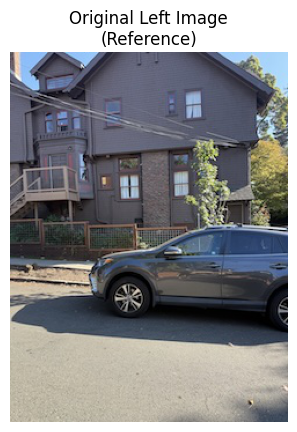

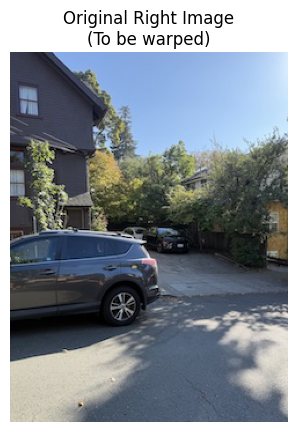

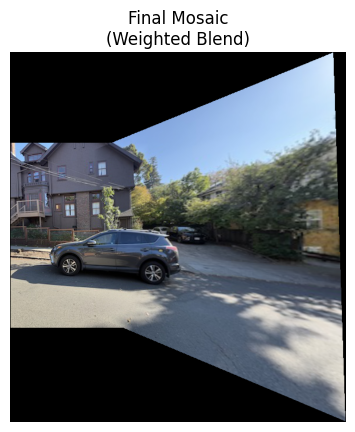

  Image 1: original shape (320, 240) -> warped corners at [[  0. 239. 239.   0.]
 [  0.   0. 319. 319.]]
  Image 2: original shape (320, 240) -> warped corners at [[-318.42494042   94.06960068   90.53176314 -318.94064251]
 [-139.78293251   22.8793375   303.05253052  475.48085158]]
Processing image 1/2...
Processing image 2/2...


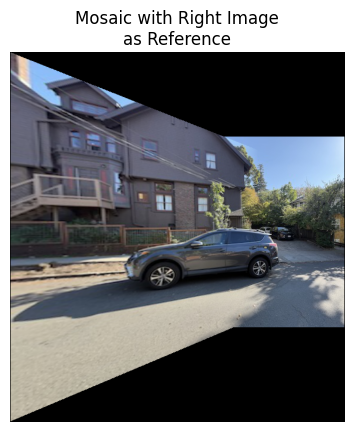

In [310]:
H_computed = computeH(img2_pts, img1_pts)
identity_matrix = np.eye(3)

images_list = [img1_array, img2_array]
homographies_list = [identity_matrix, H_computed]

mosaic_result = buildMosaic(images_list, homographies_list)

plt.imshow(img1_array)
plt.title('Original Left Image\n(Reference)')
plt.axis('off')
plt.savefig('./final_images/16_perspective_left.png', dpi=150, bbox_inches='tight')
plt.show()

plt.imshow(img2_array)
plt.title('Original Right Image\n(To be warped)')
plt.axis('off')
plt.savefig('./final_images/17_perspective_right.png', dpi=150, bbox_inches='tight')
plt.show()

plt.imshow(mosaic_result)
plt.title('Final Mosaic\n(Weighted Blend)')
plt.axis('off')
plt.savefig('./final_images/18_perspective_mosaic.png', dpi=150, bbox_inches='tight')
plt.show()

H_inverse = np.linalg.inv(H_computed)
images_list2 = [img2_array, img1_array]
homographies_list2 = [identity_matrix, H_inverse]

mosaic_result2 = buildMosaic(images_list2, homographies_list2)

plt.imshow(mosaic_result2)
plt.title('Mosaic with Right Image\nas Reference')
plt.axis('off')
plt.savefig('./final_images/19_perspective_mosaic_alt.png', dpi=150, bbox_inches='tight')
plt.show()


In [321]:
left_street = Image.open('./images/left_street.jpg')
left_street = np.array(left_street)

right_street = Image.open('./images/right_street.jpg')
right_street = np.array(right_street)

left_sign = Image.open('./images/left_sign.jpg')
left_sign = np.array(left_sign)

right_sign = Image.open('./images/right_sign.jpg')
right_sign = np.array(right_sign)

In [323]:
%matplotlib qt

plt.imshow(left_street)
plt.title('Click 8 corresponding points - left perspective')

street_pts = plt.ginput(n=8, timeout=0)
plt.close()

%matplotlib inline

In [326]:
%matplotlib qt

plt.imshow(right_street)
plt.title('Click 8 corresponding points - right perspective')

right_street_pts = plt.ginput(n=8, timeout=0)
plt.close()

%matplotlib inline

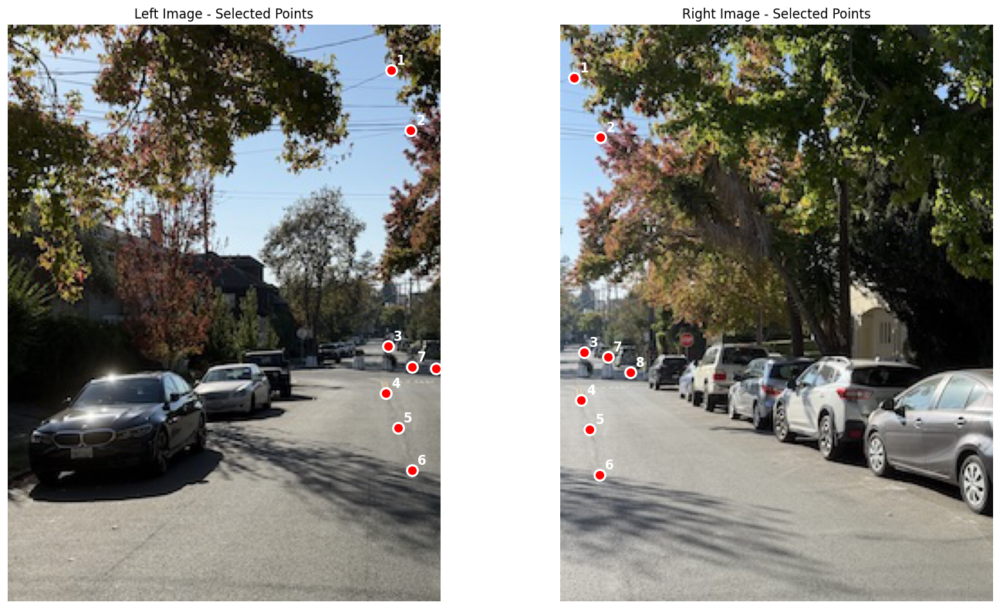

In [327]:
street_pts = np.array(street_pts)
right_street_pts = np.array(right_street_pts)

plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
plt.imshow(left_street)
plt.scatter(street_pts[:, 0], street_pts[:, 1], c='red', s=100, marker='o', edgecolors='white', linewidth=2)
for i, (x, y) in enumerate(street_pts):
    plt.annotate(f'{i+1}', (x, y), xytext=(5, 5), textcoords='offset points', 
                 color='white', fontsize=12, fontweight='bold')
plt.title('Left Image - Selected Points')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(right_street)
plt.scatter(right_street_pts[:, 0], right_street_pts[:, 1], c='red', s=100, marker='o', edgecolors='white', linewidth=2)
for i, (x, y) in enumerate(right_street_pts):
    plt.annotate(f'{i+1}', (x, y), xytext=(5, 5), textcoords='offset points', 
                 color='white', fontsize=12, fontweight='bold')
plt.title('Right Image - Selected Points')
plt.axis('off')

plt.tight_layout()
plt.savefig('./final_images/20_street_correspondences.png', dpi=150, bbox_inches='tight')
plt.show()

  Image 1: original shape (320, 240) -> warped corners at [[  0. 239. 239.   0.]
 [  0.   0. 319. 319.]]
  Image 2: original shape (320, 240) -> warped corners at [[203.99770969 519.30649066 500.1358737  199.84374702]
 [ -3.29685476 -49.26538202 408.36326082 310.96791406]]
Processing image 1/2...
Processing image 2/2...


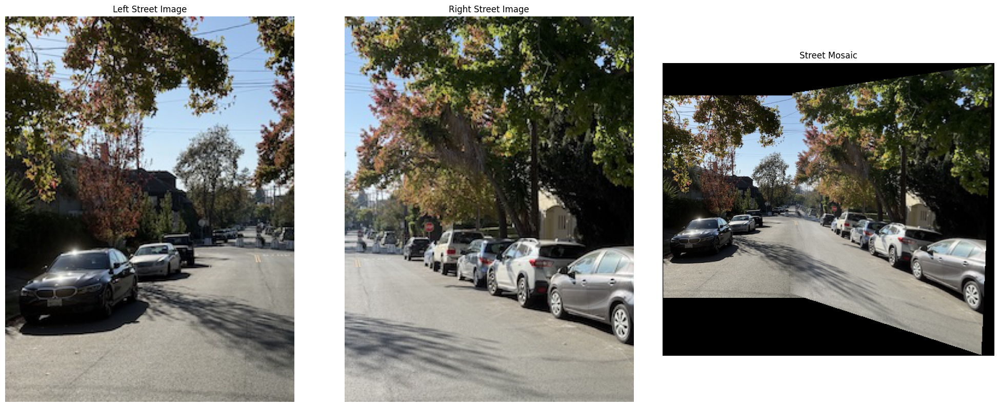

In [ ]:
H_street = computeH(right_street_pts, street_pts)
identity_matrix = np.eye(3)
street_images = [left_street, right_street]
street_homographies = [identity_matrix, H_street]
street_mosaic = buildMosaic(street_images, street_homographies)

plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
plt.imshow(left_street)
plt.title('Left Street Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(right_street)
plt.title('Right Street Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(street_mosaic)
plt.title('Street Mosaic')
plt.axis('off')

plt.tight_layout()
plt.savefig('./final_images/21_street_mosaic.png', dpi=150, bbox_inches='tight')
plt.show()


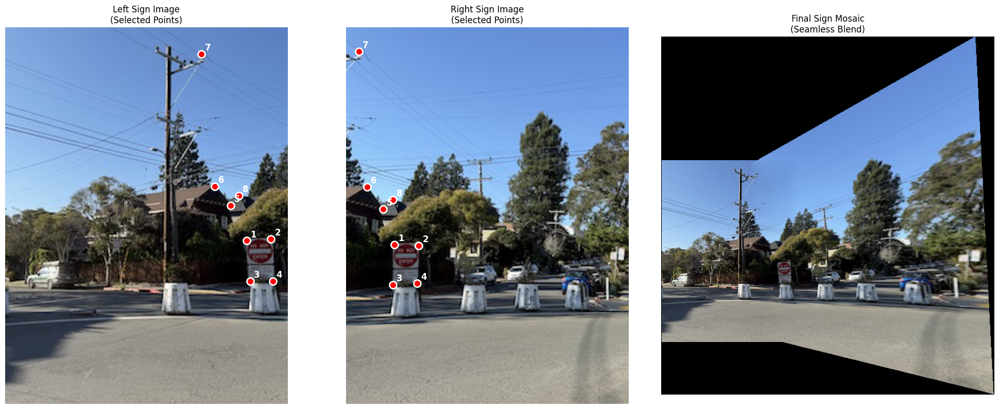

In [311]:
plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
plt.imshow(left_sign)
plt.scatter(sign_pts[:, 0], sign_pts[:, 1], c='red', s=100, marker='o', edgecolors='white', linewidth=2)
for i, (x, y) in enumerate(sign_pts):
    plt.annotate(f'{i+1}', (x, y), xytext=(5, 5), textcoords='offset points', 
                 color='white', fontsize=12, fontweight='bold')
plt.title('Left Sign Image\n(Selected Points)')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(right_sign)
plt.scatter(right_sign_pts[:, 0], right_sign_pts[:, 1], c='red', s=100, marker='o', edgecolors='white', linewidth=2)
for i, (x, y) in enumerate(right_sign_pts):
    plt.annotate(f'{i+1}', (x, y), xytext=(5, 5), textcoords='offset points', 
                 color='white', fontsize=12, fontweight='bold')
plt.title('Right Sign Image\n(Selected Points)')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(sign_mosaic)
plt.title('Final Sign Mosaic\n(Seamless Blend)')
plt.axis('off')

plt.tight_layout()
plt.show()


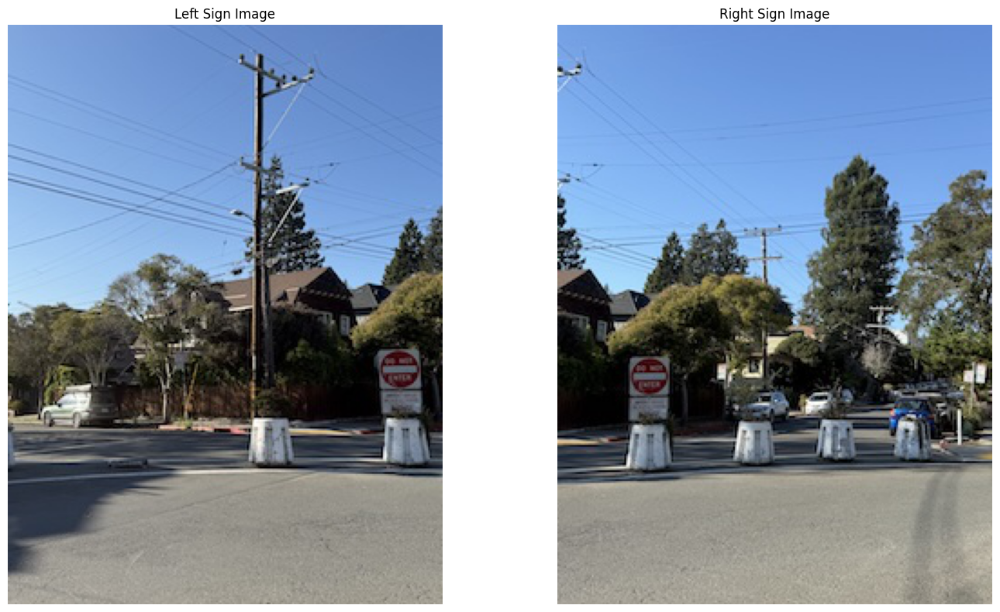

In [312]:
left_sign = Image.open('./images/left_sign.jpg')
left_sign = np.array(left_sign)

right_sign = Image.open('./images/right_sign.jpg')
right_sign = np.array(right_sign)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(left_sign)
plt.title('Left Sign Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(right_sign)
plt.title('Right Sign Image')
plt.axis('off')

plt.tight_layout()
plt.savefig('./final_images/22_sign_source_images.png', dpi=150, bbox_inches='tight')
plt.show()


In [313]:
%matplotlib qt

plt.imshow(left_sign)
plt.title('Click corresponding points - left sign')

sign_pts = plt.ginput(n=8, timeout=0)
plt.close()

%matplotlib inline


In [317]:
%matplotlib qt

plt.imshow(right_sign)
plt.title('Click corresponding points - right sign')

right_sign_pts = plt.ginput(n=8, timeout=0)
plt.close()

%matplotlib inline


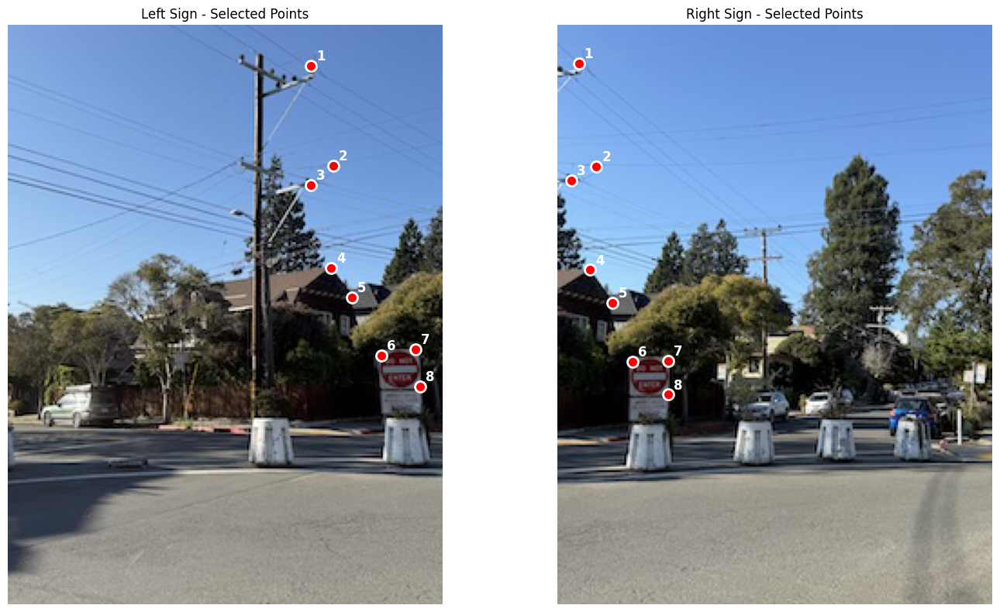

In [318]:
%matplotlib inline

sign_pts = np.array(sign_pts)
right_sign_pts = np.array(right_sign_pts)

plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
plt.imshow(left_sign)
plt.scatter(sign_pts[:, 0], sign_pts[:, 1], c='red', s=100, marker='o', edgecolors='white', linewidth=2)
for i, (x, y) in enumerate(sign_pts):
    plt.annotate(f'{i+1}', (x, y), xytext=(5, 5), textcoords='offset points', 
                 color='white', fontsize=12, fontweight='bold')
plt.title('Left Sign - Selected Points')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(right_sign)
plt.scatter(right_sign_pts[:, 0], right_sign_pts[:, 1], c='red', s=100, marker='o', edgecolors='white', linewidth=2)
for i, (x, y) in enumerate(right_sign_pts):
    plt.annotate(f'{i+1}', (x, y), xytext=(5, 5), textcoords='offset points', 
                 color='white', fontsize=12, fontweight='bold')
plt.title('Right Sign - Selected Points')
plt.axis('off')

plt.tight_layout()
plt.savefig('./final_images/23_sign_correspondences.png', dpi=150, bbox_inches='tight')
plt.show()


In [319]:
H_sign = computeH(right_sign_pts, sign_pts)
identity_matrix = np.eye(3)
sign_images = [left_sign, right_sign]
sign_homographies = [identity_matrix, H_sign]
sign_mosaic = buildMosaic(sign_images, sign_homographies)


  Image 1: original shape (320, 240) -> warped corners at [[  0. 239. 239.   0.]
 [  0.   0. 319. 319.]]
  Image 2: original shape (320, 240) -> warped corners at [[ 155.72899221  522.93686229  539.43252172  170.85386556]
 [   6.6952974  -166.85326909  362.11450306  314.07955337]]
Processing image 1/2...
Processing image 2/2...


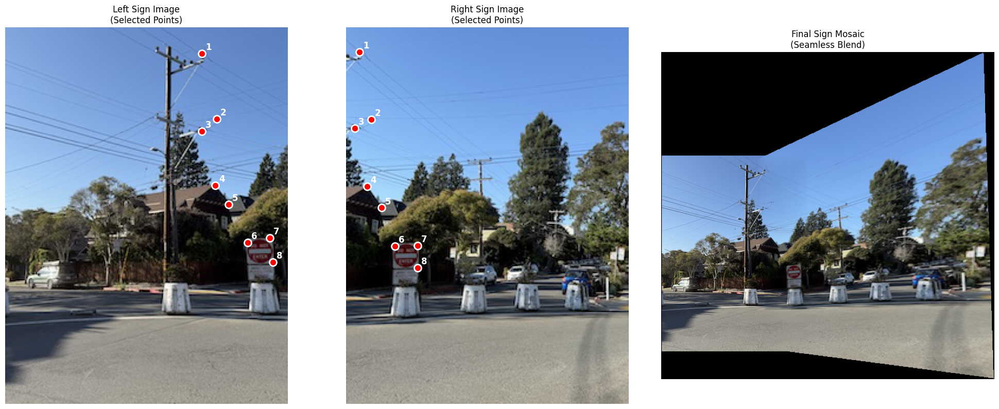

In [320]:
plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
plt.imshow(left_sign)
plt.scatter(sign_pts[:, 0], sign_pts[:, 1], c='red', s=100, marker='o', edgecolors='white', linewidth=2)
for i, (x, y) in enumerate(sign_pts):
    plt.annotate(f'{i+1}', (x, y), xytext=(5, 5), textcoords='offset points', 
                 color='white', fontsize=12, fontweight='bold')
plt.title('Left Sign Image\n(Selected Points)')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(right_sign)
plt.scatter(right_sign_pts[:, 0], right_sign_pts[:, 1], c='red', s=100, marker='o', edgecolors='white', linewidth=2)
for i, (x, y) in enumerate(right_sign_pts):
    plt.annotate(f'{i+1}', (x, y), xytext=(5, 5), textcoords='offset points', 
                 color='white', fontsize=12, fontweight='bold')
plt.title('Right Sign Image\n(Selected Points)')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(sign_mosaic)
plt.title('Final Sign Mosaic\n(Seamless Blend)')
plt.axis('off')

plt.tight_layout()
plt.savefig('./final_images/24_sign_mosaic.png', dpi=150, bbox_inches='tight')
plt.show()
